In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import average_precision_score
from inspect import signature
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from matplotlib import pyplot

print("Setup Complete")

Setup Complete


In [2]:
df = pd.read_csv("dataset_5secondWindow.csv") #dataset_halfSecondWindows
df.info
# first doing label encodingon User

# sorting based on the user label



# plotting given_user distribution


# making split

<bound method DataFrame.info of       Unnamed: 0     id   time  activityrecognition#0  activityrecognition#1  \
0              0  16170   78.0                    NaN                  100.0   
1              1  15871  145.0                    NaN                  100.0   
2              2  16811  150.0                    NaN                  100.0   
3              3  15831  105.0                    NaN                   77.0   
4              4    876   77.0                    NaN                  100.0   
...          ...    ...    ...                    ...                    ...   
5888        5888  14125    4.0                    NaN                  100.0   
5889        5889  19582   32.0                    NaN                   10.0   
5890        5890  16178   86.0                    NaN                  100.0   
5891        5891  10973  199.0                    NaN                  100.0   
5892        5892   8278   55.0                    NaN                  100.0   

      a

In [3]:
df

,Unnamed: 0,id,time,activityrecognition#0,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
0,0,16170,78.0,NaN,100.0,9.811476,9.758895,9.849411,0.014626,0.029340,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,Still,U12
1,1,15871,145.0,NaN,100.0,9.939207,7.707437,17.146631,1.775944,0.999925,...,89.200210,89.065143,89.335277,0.191013,16.539349,16.539349,16.539349,0.628595,Car,U12
2,2,16811,150.0,NaN,100.0,9.827178,9.804817,9.849262,0.011199,0.665215,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,Still,U12
3,3,15831,105.0,NaN,77.0,9.673039,7.659674,12.304298,0.862553,0.996221,...,87.470377,87.470377,87.470377,2.284186,17.739895,17.739895,17.739895,0.628595,Car,U12
4,4,876,77.0,NaN,100.0,9.993466,8.965621,10.891645,0.504117,0.563792,...,89.770732,89.770732,89.770732,0.006389,9.000000,9.000000,9.000000,NaN,Car,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,5888,14125,4.0,NaN,100.0,10.066610,4.564648,13.414389,3.373972,0.986319,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Walking,U2
5889,5889,19582,32.0,NaN,10.0,9.964271,8.768007,11.454213,0.665529,0.648602,...,NaN,NaN,NaN,NaN,31.960054,31.960054,31.960054,NaN,Train,U3
5890,5890,16178,86.0,NaN,100.0,9.812893,9.772881,9.862587,0.017633,0.024392,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,Still,U12
5891,5891,10973,199.0,NaN,100.0,9.831144,9.807347,9.874450,0.013485,0.481212,...,NaN,NaN,NaN,NaN,1.090415,1.090415,1.090415,NaN,Still,U10


In [4]:
#df.apply(preprocessing.LabelEncoder().fit_transform(df['user']))

In [5]:
user_df = df['user'].value_counts()
user_df

U1     2470
U12     820
U10     531
U7      397
U3      331
U6      279
U2      271
U4      227
U8      214
U11     167
U13      90
U9       79
U5       17
Name: user, dtype: int64

In [6]:
df['target'].value_counts()

Car        1180
Train      1179
Still      1179
Bus        1178
Walking    1177
Name: target, dtype: int64

In [7]:
cleanup_target = {"target": {"Car":1,"Still":2,"Train":3,"Bus":4,"Walking":5}}
df = df.replace(cleanup_target)
df

,Unnamed: 0,id,time,activityrecognition#0,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
0,0,16170,78.0,NaN,100.0,9.811476,9.758895,9.849411,0.014626,0.029340,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,2,U12
1,1,15871,145.0,NaN,100.0,9.939207,7.707437,17.146631,1.775944,0.999925,...,89.200210,89.065143,89.335277,0.191013,16.539349,16.539349,16.539349,0.628595,1,U12
2,2,16811,150.0,NaN,100.0,9.827178,9.804817,9.849262,0.011199,0.665215,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,2,U12
3,3,15831,105.0,NaN,77.0,9.673039,7.659674,12.304298,0.862553,0.996221,...,87.470377,87.470377,87.470377,2.284186,17.739895,17.739895,17.739895,0.628595,1,U12
4,4,876,77.0,NaN,100.0,9.993466,8.965621,10.891645,0.504117,0.563792,...,89.770732,89.770732,89.770732,0.006389,9.000000,9.000000,9.000000,NaN,1,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,5888,14125,4.0,NaN,100.0,10.066610,4.564648,13.414389,3.373972,0.986319,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,U2
5889,5889,19582,32.0,NaN,10.0,9.964271,8.768007,11.454213,0.665529,0.648602,...,NaN,NaN,NaN,NaN,31.960054,31.960054,31.960054,NaN,3,U3
5890,5890,16178,86.0,NaN,100.0,9.812893,9.772881,9.862587,0.017633,0.024392,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,2,U12
5891,5891,10973,199.0,NaN,100.0,9.831144,9.807347,9.874450,0.013485,0.481212,...,NaN,NaN,NaN,NaN,1.090415,1.090415,1.090415,NaN,2,U10


In [8]:
cleanup_nums = {"user": {"andrea": 1, "Luca": 2, "Damiano": 3,"michelangelo": 4,
                         "Pierpaolo": 5, "Vincenzo": 6,"IvanHeibi":7,"AndreaCarpineti":8,
                         "Federica":9,"Serena":10,"Claudio":11,"Elena":12,
                         "Riccardo":13}}

df = df.replace(cleanup_nums)
df

,Unnamed: 0,id,time,activityrecognition#0,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
0,0,16170,78.0,NaN,100.0,9.811476,9.758895,9.849411,0.014626,0.029340,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,2,U12
1,1,15871,145.0,NaN,100.0,9.939207,7.707437,17.146631,1.775944,0.999925,...,89.200210,89.065143,89.335277,0.191013,16.539349,16.539349,16.539349,0.628595,1,U12
2,2,16811,150.0,NaN,100.0,9.827178,9.804817,9.849262,0.011199,0.665215,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,2,U12
3,3,15831,105.0,NaN,77.0,9.673039,7.659674,12.304298,0.862553,0.996221,...,87.470377,87.470377,87.470377,2.284186,17.739895,17.739895,17.739895,0.628595,1,U12
4,4,876,77.0,NaN,100.0,9.993466,8.965621,10.891645,0.504117,0.563792,...,89.770732,89.770732,89.770732,0.006389,9.000000,9.000000,9.000000,NaN,1,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,5888,14125,4.0,NaN,100.0,10.066610,4.564648,13.414389,3.373972,0.986319,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,U2
5889,5889,19582,32.0,NaN,10.0,9.964271,8.768007,11.454213,0.665529,0.648602,...,NaN,NaN,NaN,NaN,31.960054,31.960054,31.960054,NaN,3,U3
5890,5890,16178,86.0,NaN,100.0,9.812893,9.772881,9.862587,0.017633,0.024392,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,2,U12
5891,5891,10973,199.0,NaN,100.0,9.831144,9.807347,9.874450,0.013485,0.481212,...,NaN,NaN,NaN,NaN,1.090415,1.090415,1.090415,NaN,2,U10


In [9]:
# sorting the df by column
df1 = df.sort_values(by=['user'])
df1 = df1.dropna(axis=1, how='all')
df1 = df1.fillna(df.mean())
df1

,Unnamed: 0,id,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
2946,2946,5228,190.0,92.0,10.179832,10.137434,10.207683,0.020380,0.995086,0.995067,...,84.350732,84.350732,84.350732,0.923820,8.235254,8.216747,8.253528,0.236959,3,U1
3075,3075,5835,193.0,35.0,10.179362,9.853068,10.587065,0.167584,0.987558,0.987359,...,89.762268,89.762268,89.762268,0.001198,8.235254,8.216747,8.253528,0.236959,3,U1
3076,3076,2274,256.0,8.0,9.657759,9.029124,10.286443,0.414025,0.844973,0.840452,...,89.769040,89.769040,89.769040,0.013131,30.750000,30.750000,30.750000,0.236959,1,U1
3077,3077,7287,86.0,100.0,10.299321,8.088142,12.456252,1.604990,0.968824,0.956427,...,88.572737,88.572737,88.572737,0.095157,0.750000,0.750000,0.750000,0.236959,5,U1
3079,3079,184,91.0,85.0,9.729062,7.139446,14.355289,2.184604,0.928255,0.925184,...,89.773691,89.767912,89.779470,0.008173,11.000000,11.000000,11.000000,0.236959,4,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1198,1198,12888,47.0,100.0,10.672879,6.701437,14.237094,2.590851,0.759280,0.743872,...,78.724855,78.451658,78.997213,1.913065,8.235254,8.216747,8.253528,0.236959,5,U9
3307,3307,12836,94.0,85.0,10.926161,7.289184,16.733950,2.618939,0.759280,0.743872,...,83.545534,83.545534,83.545534,1.800958,8.235254,8.216747,8.253528,0.236959,5,U9
4087,4087,12806,64.0,100.0,11.173896,6.759052,17.244942,2.834614,0.759280,0.743872,...,78.116997,78.116997,78.116997,1.800958,8.235254,8.216747,8.253528,0.236959,5,U9
3576,3576,12897,56.0,100.0,8.883861,4.312250,14.790456,3.825252,0.759280,0.743872,...,78.724855,78.451658,78.997213,1.913065,8.235254,8.216747,8.253528,0.236959,5,U9


In [10]:
print(user_df)
total_cum = 0
for items in user_df.iteritems():
    total_cum += items[1]
    print(total_cum, "cum_percentage",round(total_cum/5893,2))

U1     2470
U12     820
U10     531
U7      397
U3      331
U6      279
U2      271
U4      227
U8      214
U11     167
U13      90
U9       79
U5       17
Name: user, dtype: int64
2470 cum_percentage 0.42
3290 cum_percentage 0.56
3821 cum_percentage 0.65
4218 cum_percentage 0.72
4549 cum_percentage 0.77
4828 cum_percentage 0.82
5099 cum_percentage 0.87
5326 cum_percentage 0.9
5540 cum_percentage 0.94
5707 cum_percentage 0.97
5797 cum_percentage 0.98
5876 cum_percentage 1.0
5893 cum_percentage 1.0


<AxesSubplot:>

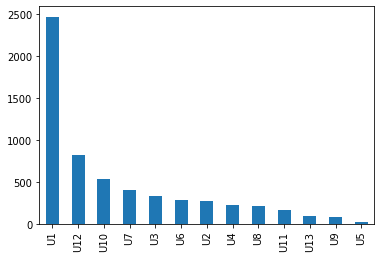

In [11]:
df['user'].value_counts().plot(kind='bar')

In [12]:
## splitting for test 
df1.isna().any().sum()


0

In [13]:
#df1

In [14]:
df2 = df1


Before Removing Outliers


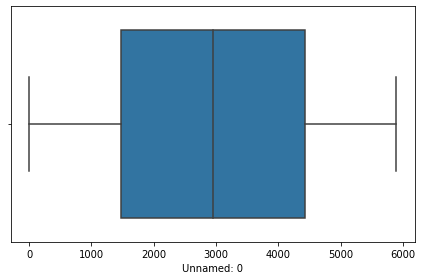

After Removing Outliers


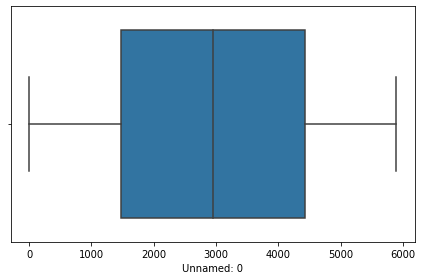

Before Removing Outliers


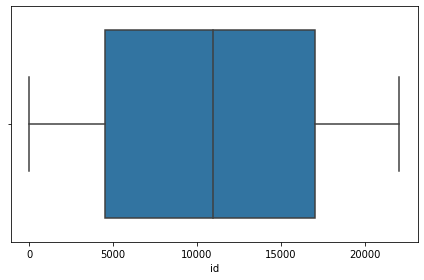

After Removing Outliers


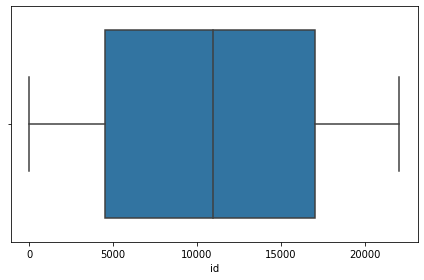

Before Removing Outliers


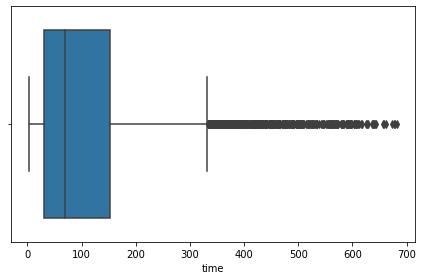

After Removing Outliers


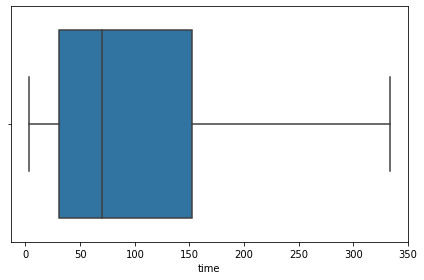

Before Removing Outliers


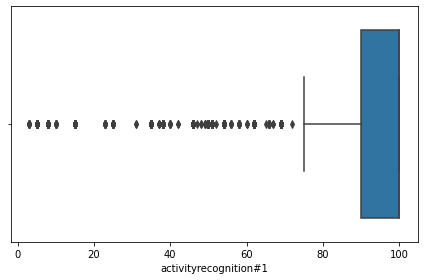

After Removing Outliers


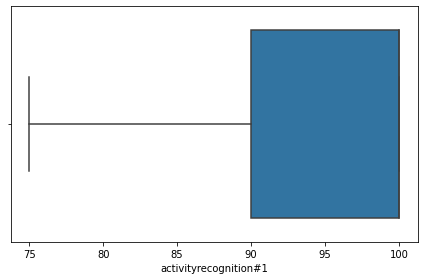

Before Removing Outliers


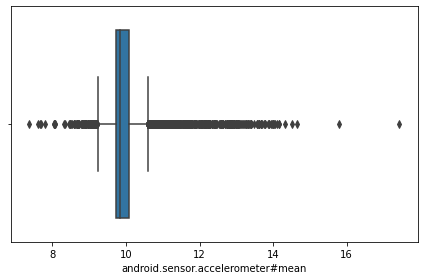

After Removing Outliers


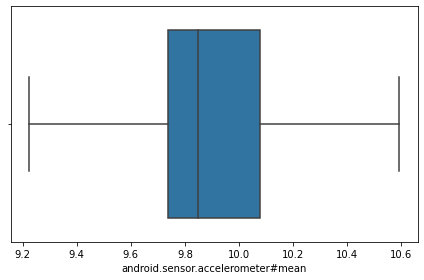

Before Removing Outliers


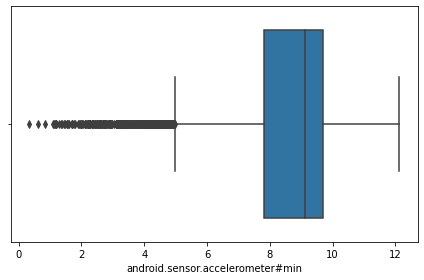

After Removing Outliers


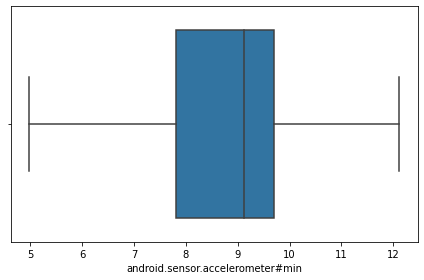

Before Removing Outliers


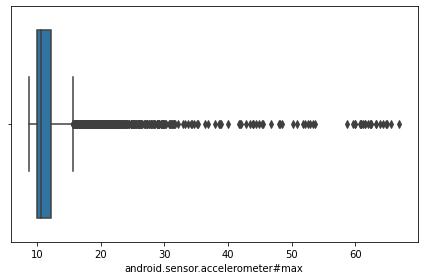

After Removing Outliers


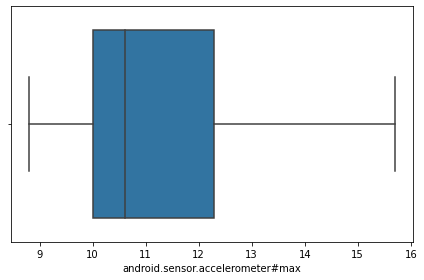

Before Removing Outliers


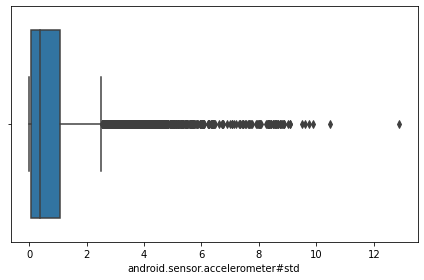

After Removing Outliers


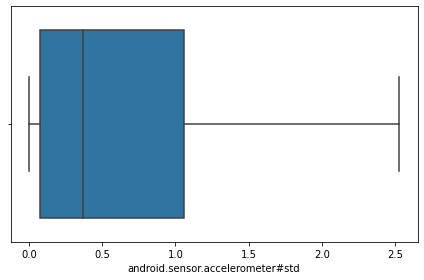

Before Removing Outliers


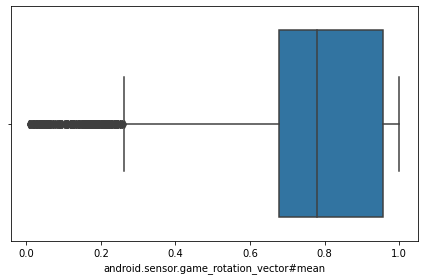

After Removing Outliers


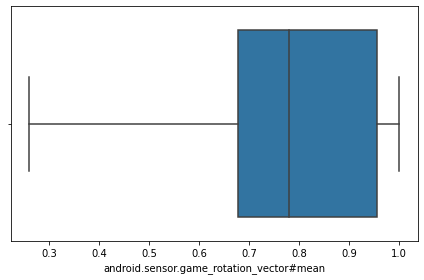

Before Removing Outliers


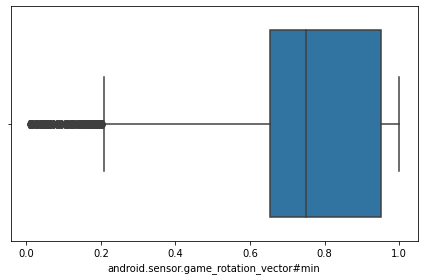

After Removing Outliers


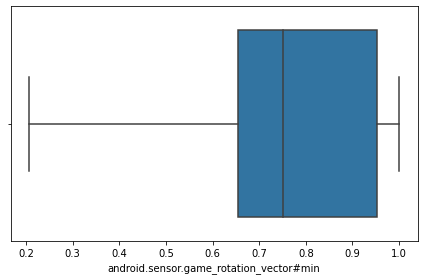

Before Removing Outliers


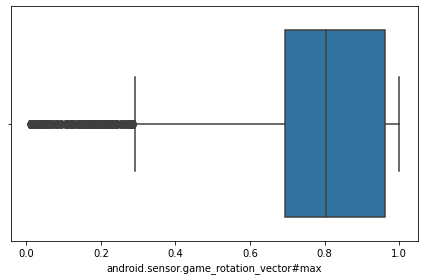

After Removing Outliers


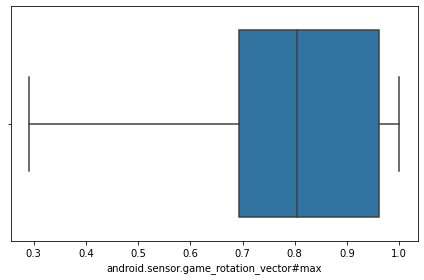

Before Removing Outliers


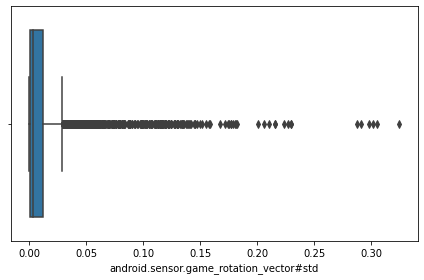

After Removing Outliers


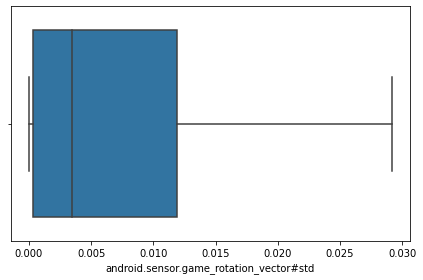

Before Removing Outliers


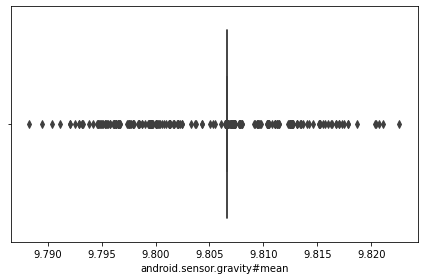

After Removing Outliers


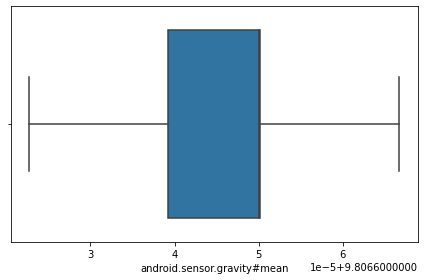

Before Removing Outliers


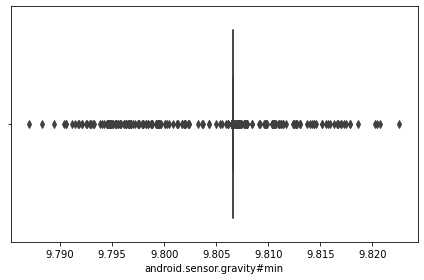

After Removing Outliers


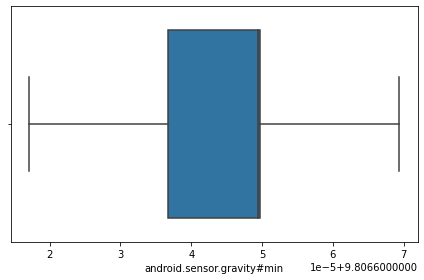

Before Removing Outliers


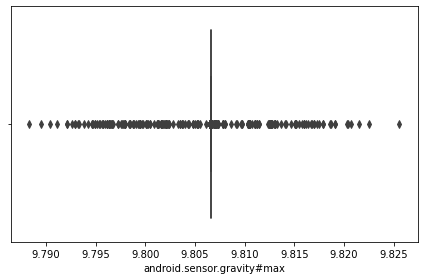

After Removing Outliers


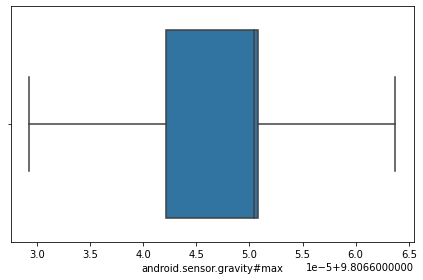

Before Removing Outliers


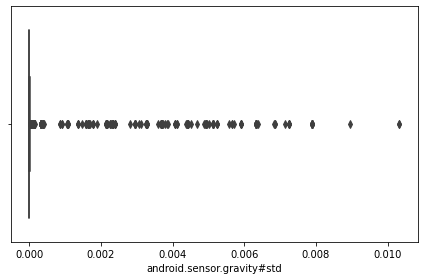

After Removing Outliers


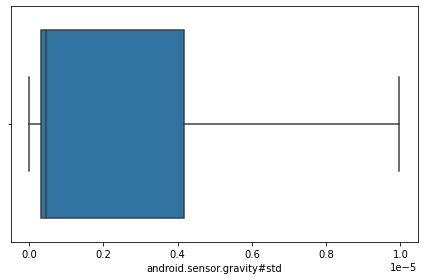

Before Removing Outliers


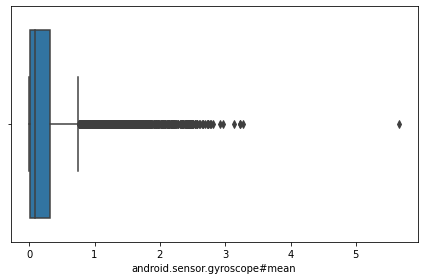

After Removing Outliers


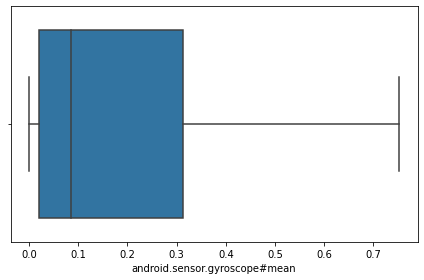

Before Removing Outliers


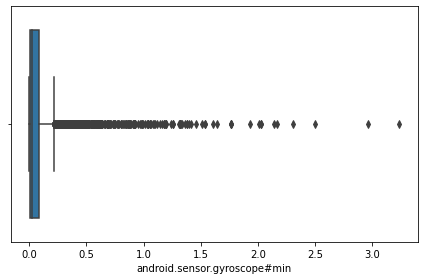

After Removing Outliers


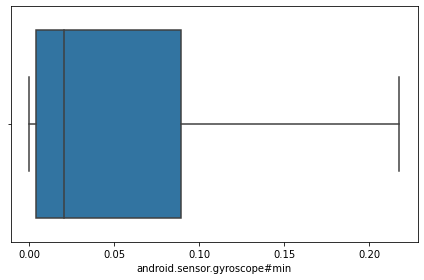

Before Removing Outliers


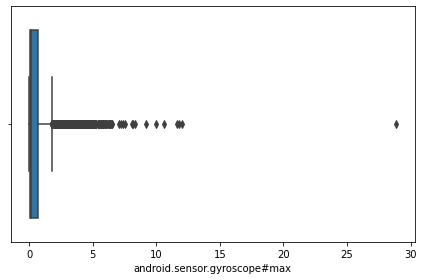

After Removing Outliers


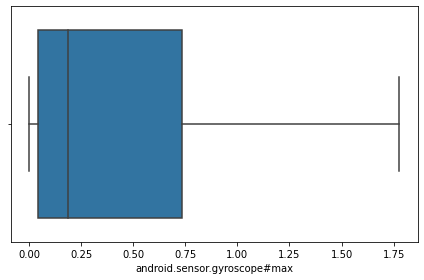

Before Removing Outliers


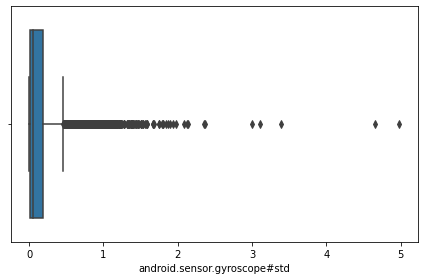

After Removing Outliers


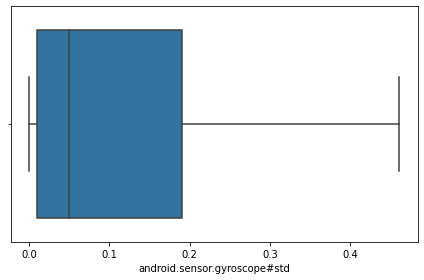

Before Removing Outliers


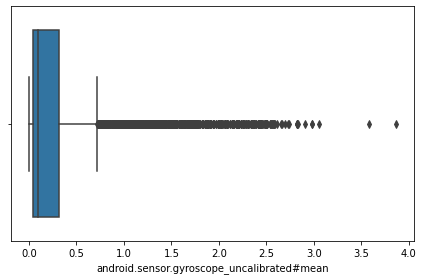

After Removing Outliers


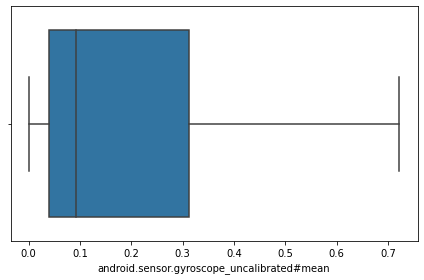

Before Removing Outliers


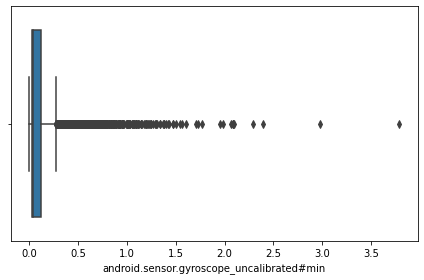

After Removing Outliers


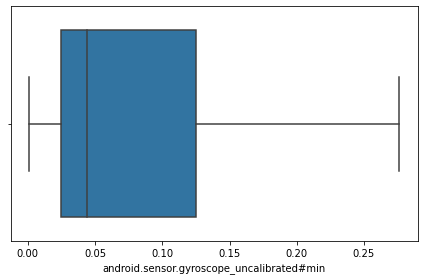

Before Removing Outliers


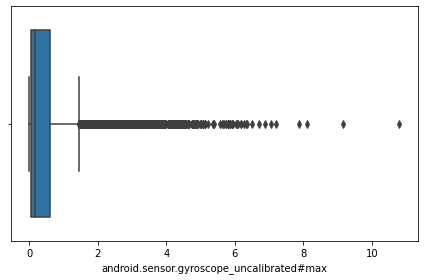

After Removing Outliers


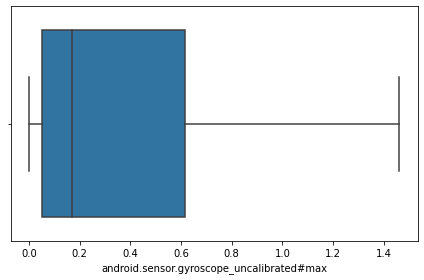

Before Removing Outliers


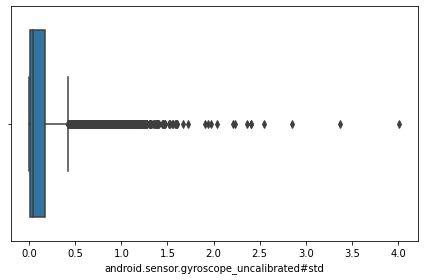

After Removing Outliers


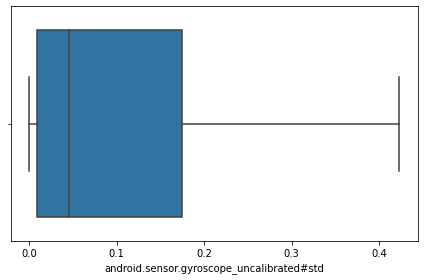

Before Removing Outliers


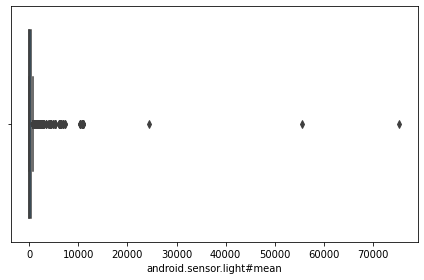

After Removing Outliers


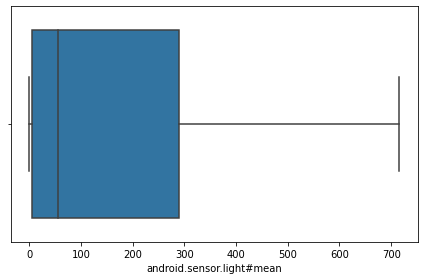

Before Removing Outliers


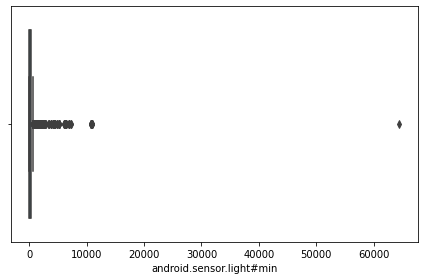

After Removing Outliers


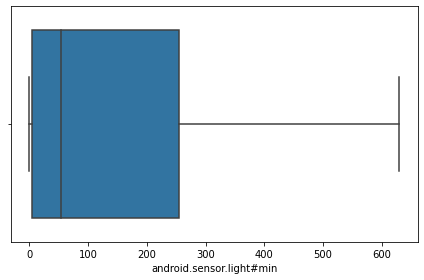

Before Removing Outliers


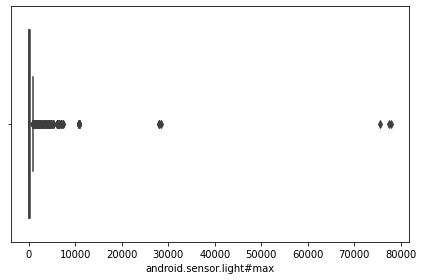

After Removing Outliers


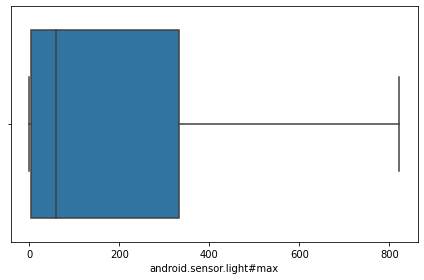

Before Removing Outliers


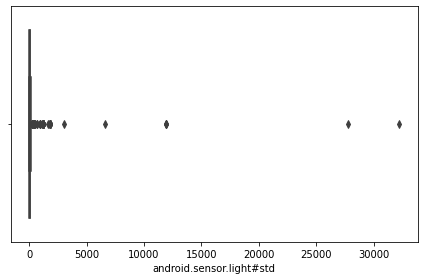

After Removing Outliers


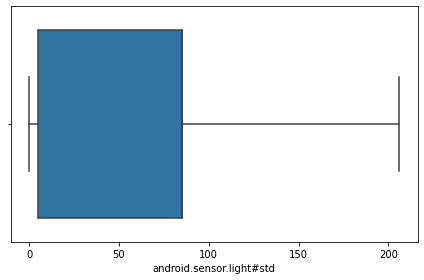

Before Removing Outliers


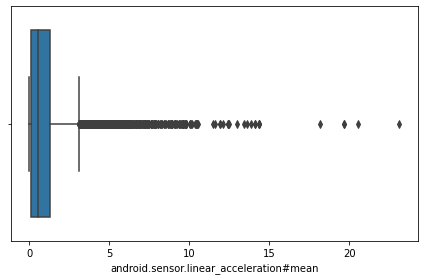

After Removing Outliers


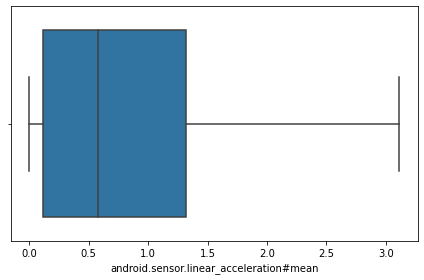

Before Removing Outliers


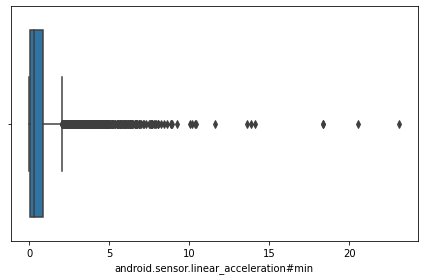

After Removing Outliers


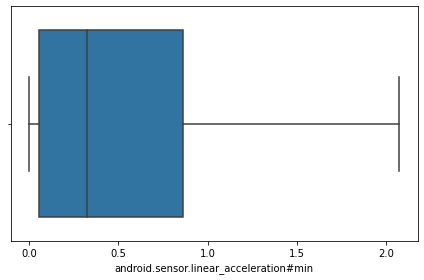

Before Removing Outliers


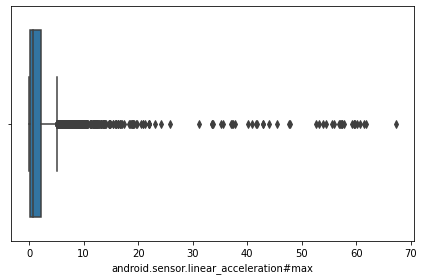

After Removing Outliers


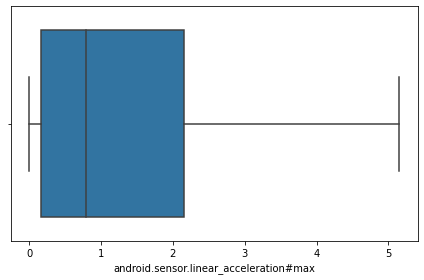

Before Removing Outliers


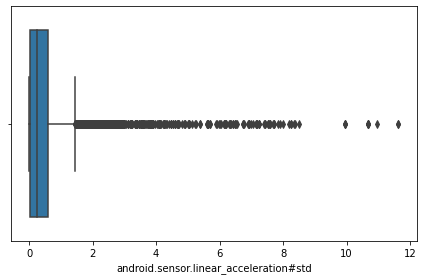

After Removing Outliers


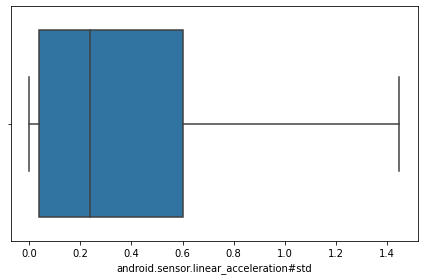

Before Removing Outliers


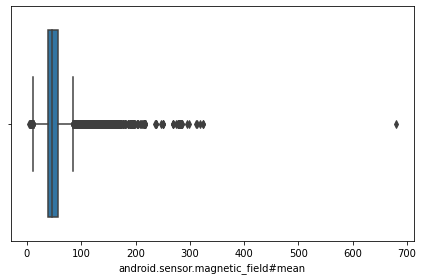

After Removing Outliers


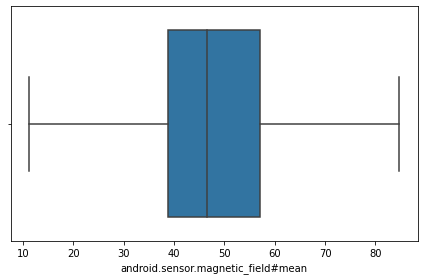

Before Removing Outliers


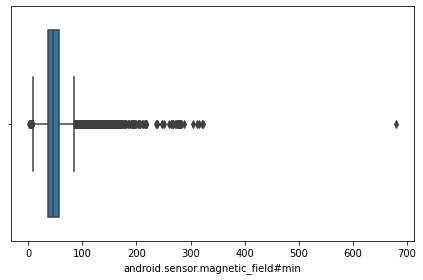

After Removing Outliers


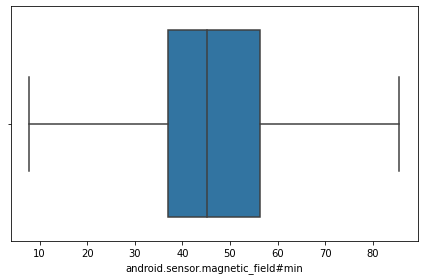

Before Removing Outliers


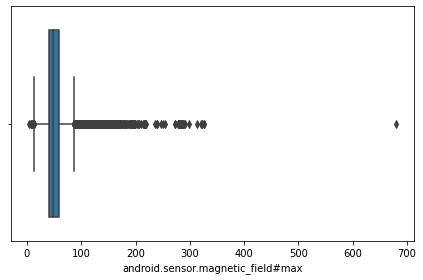

After Removing Outliers


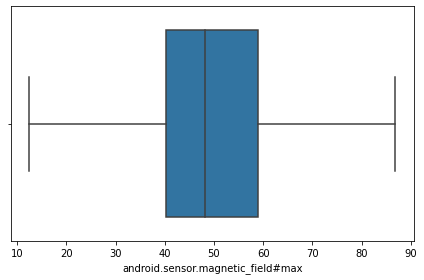

Before Removing Outliers


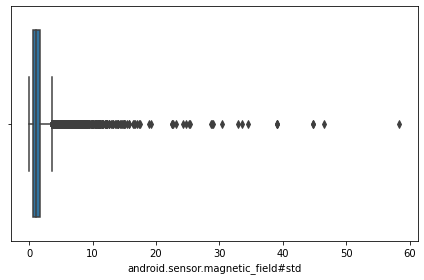

After Removing Outliers


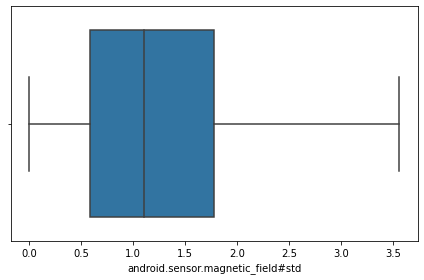

Before Removing Outliers


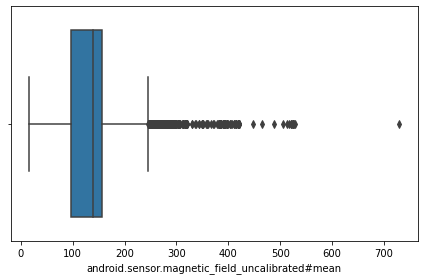

After Removing Outliers


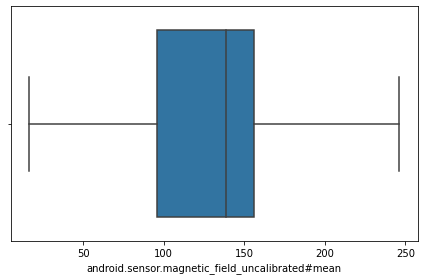

Before Removing Outliers


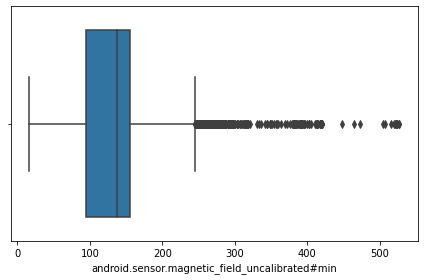

After Removing Outliers


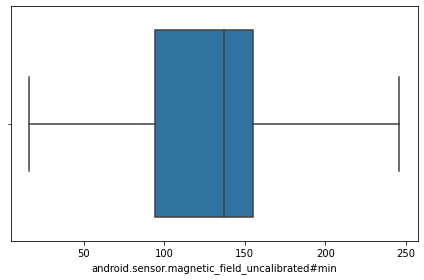

Before Removing Outliers


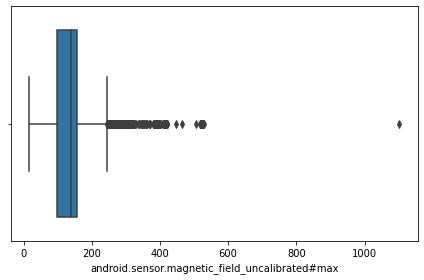

After Removing Outliers


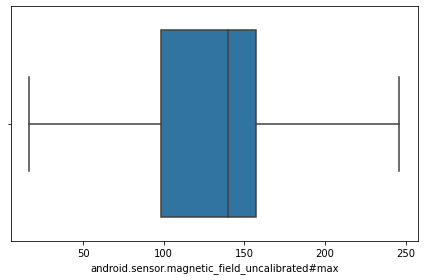

Before Removing Outliers


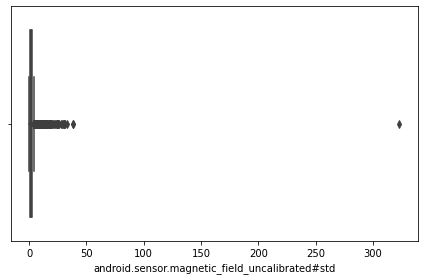

After Removing Outliers


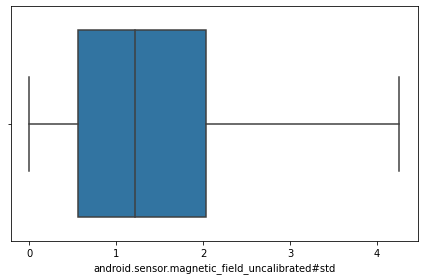

Before Removing Outliers


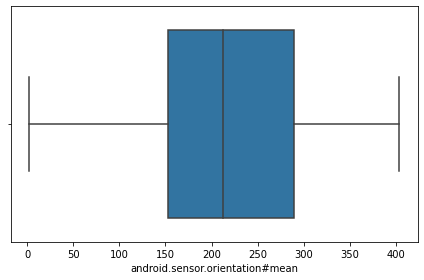

After Removing Outliers


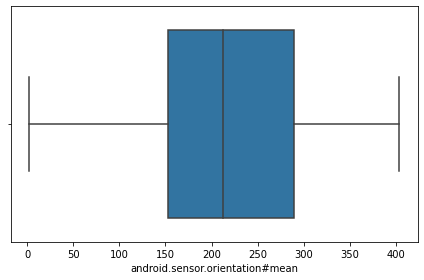

Before Removing Outliers


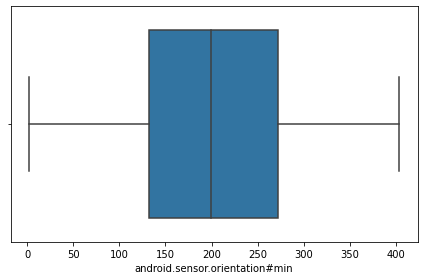

After Removing Outliers


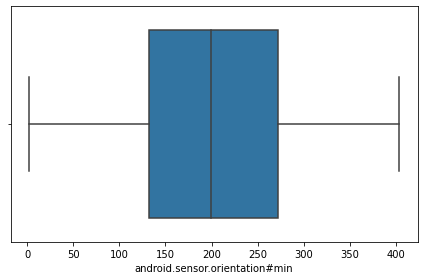

Before Removing Outliers


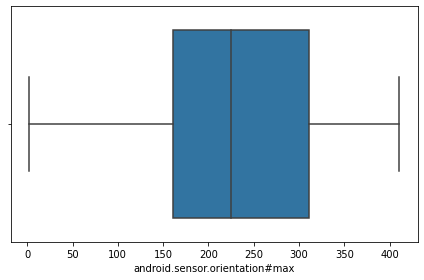

After Removing Outliers


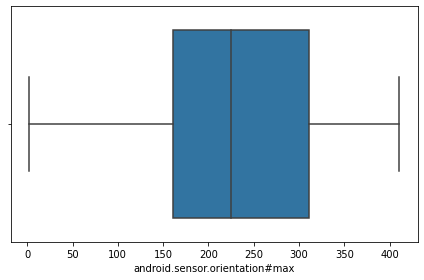

Before Removing Outliers


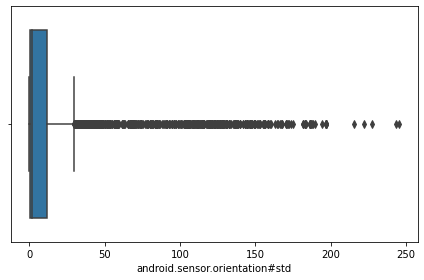

After Removing Outliers


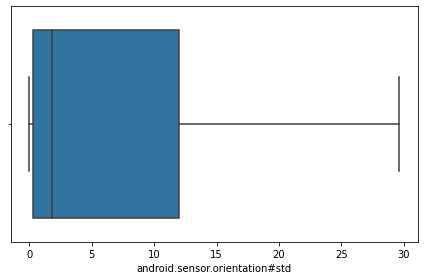

Before Removing Outliers


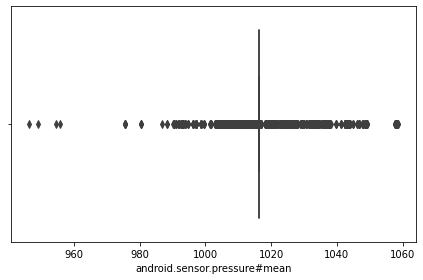

After Removing Outliers


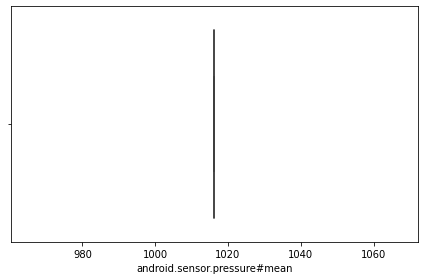

Before Removing Outliers


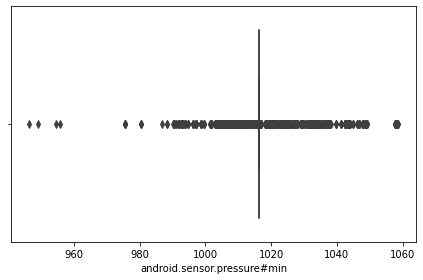

After Removing Outliers


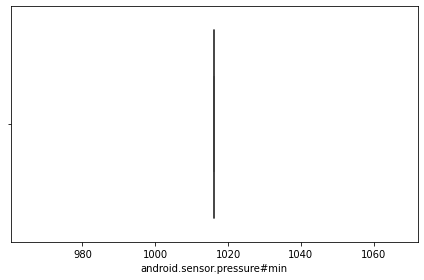

Before Removing Outliers


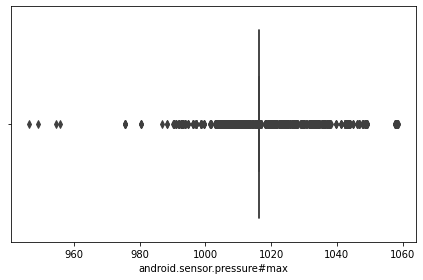

After Removing Outliers


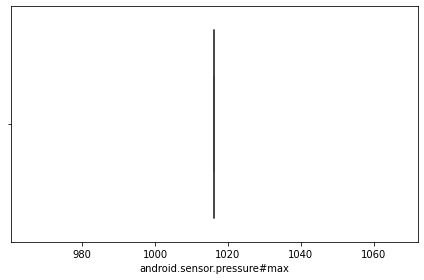

Before Removing Outliers


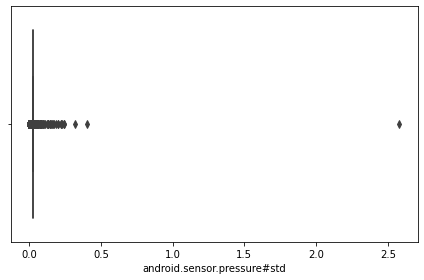

After Removing Outliers


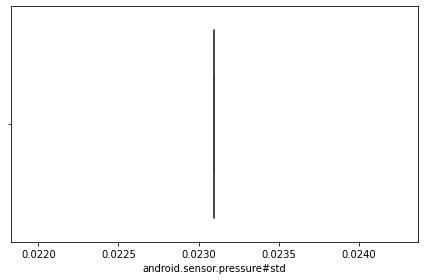

Before Removing Outliers


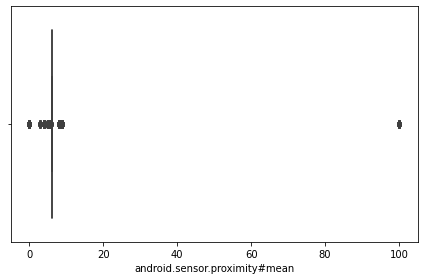

After Removing Outliers


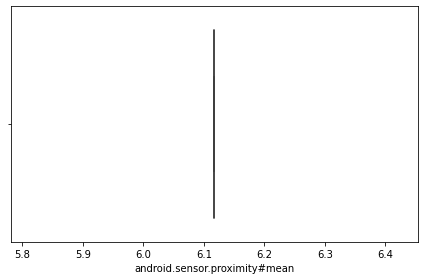

Before Removing Outliers


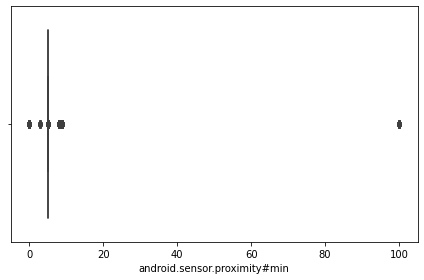

After Removing Outliers


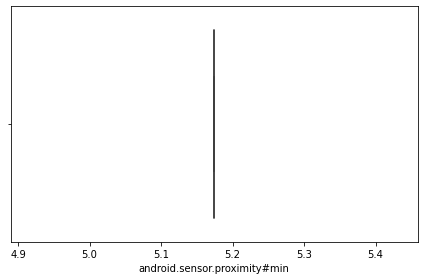

Before Removing Outliers


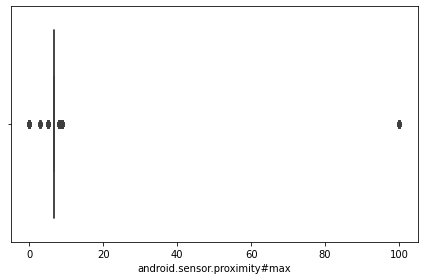

After Removing Outliers


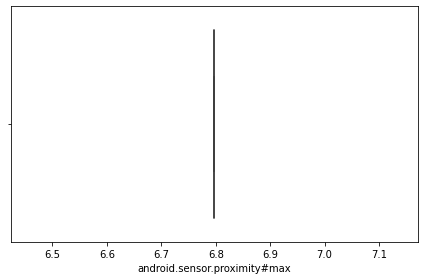

Before Removing Outliers


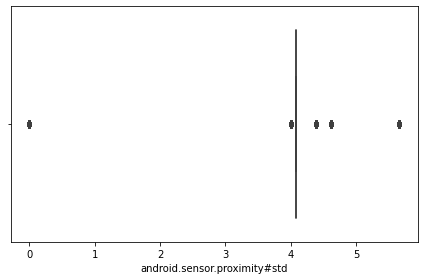

After Removing Outliers


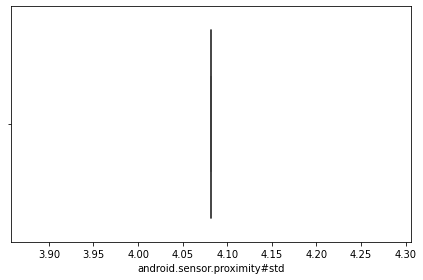

Before Removing Outliers


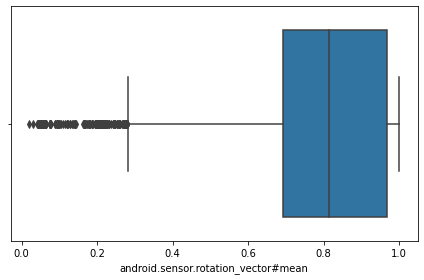

After Removing Outliers


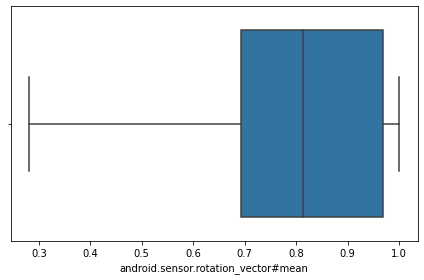

Before Removing Outliers


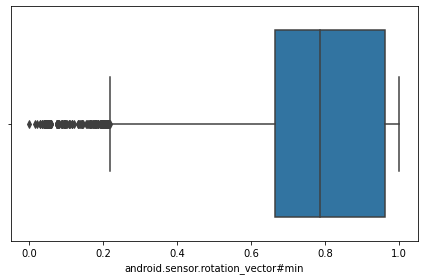

After Removing Outliers


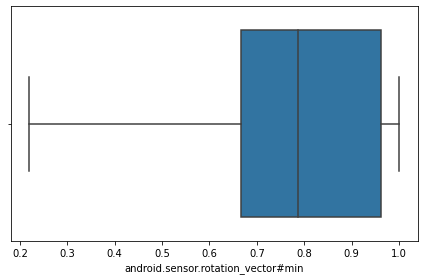

Before Removing Outliers


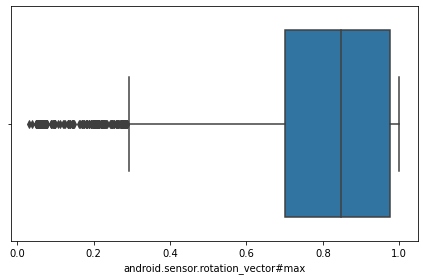

After Removing Outliers


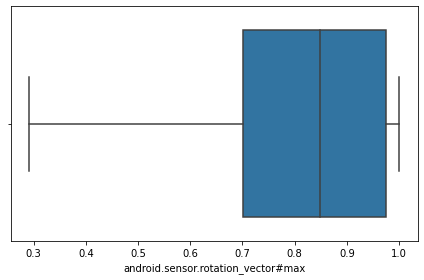

Before Removing Outliers


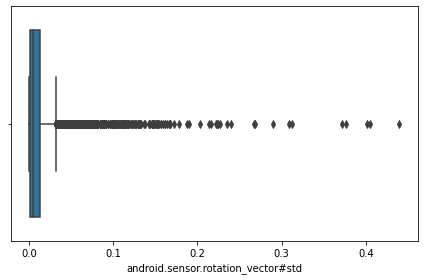

After Removing Outliers


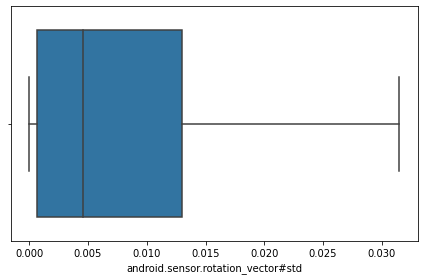

Before Removing Outliers


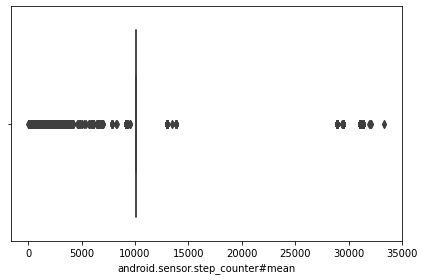

After Removing Outliers


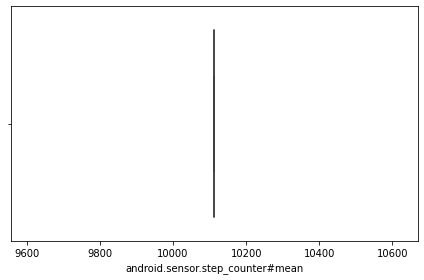

Before Removing Outliers


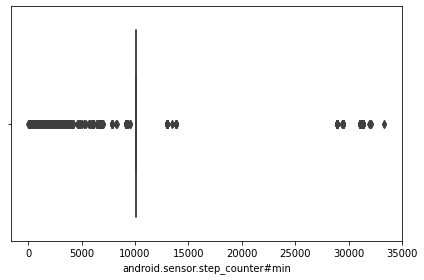

After Removing Outliers


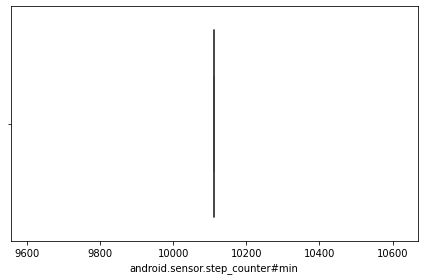

Before Removing Outliers


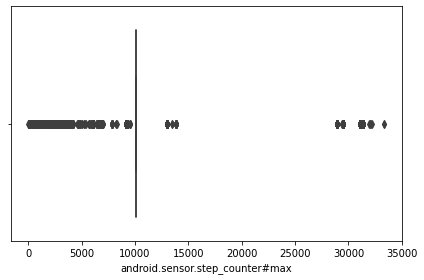

After Removing Outliers


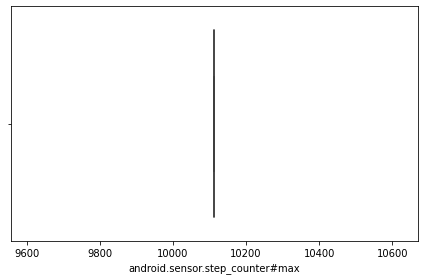

Before Removing Outliers


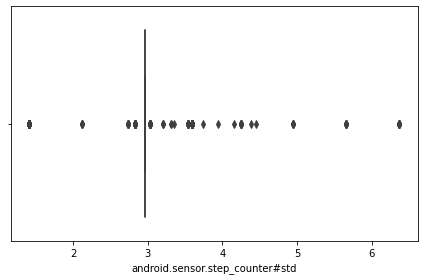

After Removing Outliers


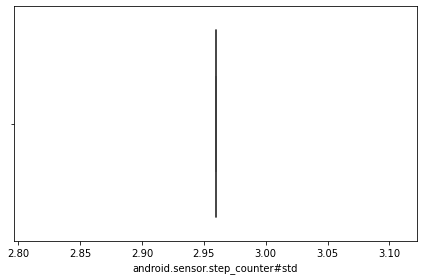

Before Removing Outliers


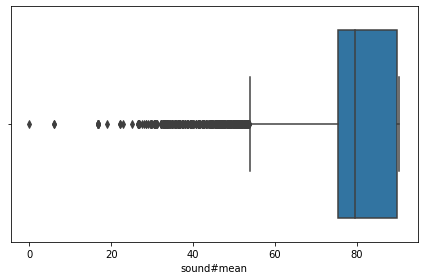

After Removing Outliers


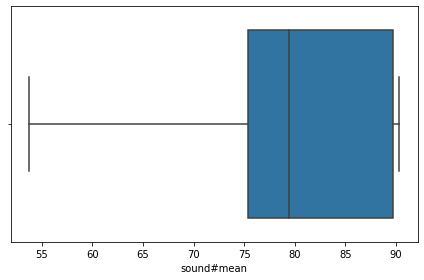

Before Removing Outliers


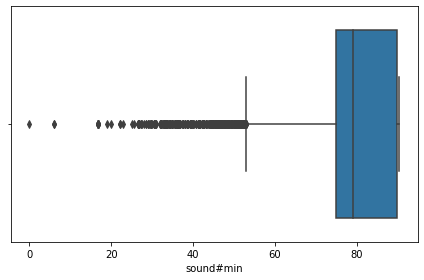

After Removing Outliers


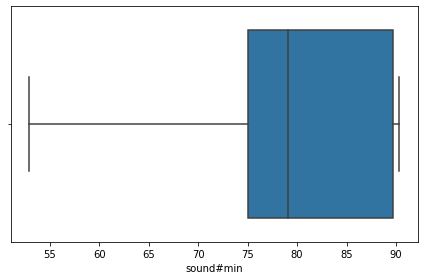

Before Removing Outliers


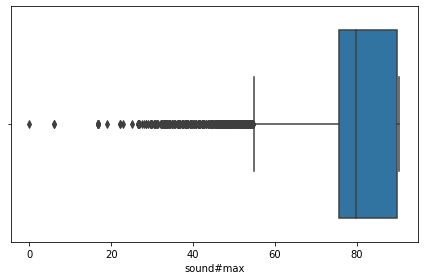

After Removing Outliers


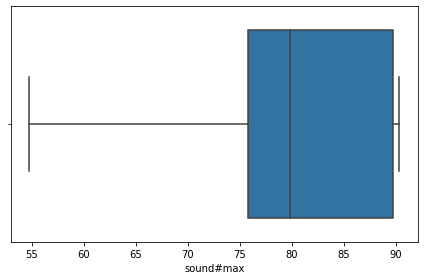

Before Removing Outliers


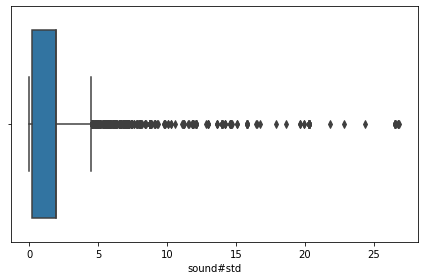

After Removing Outliers


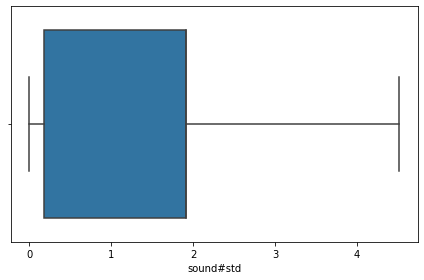

Before Removing Outliers


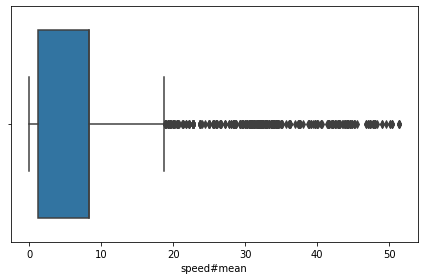

After Removing Outliers


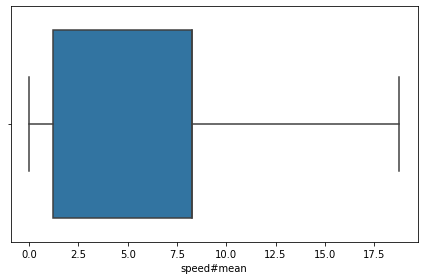

Before Removing Outliers


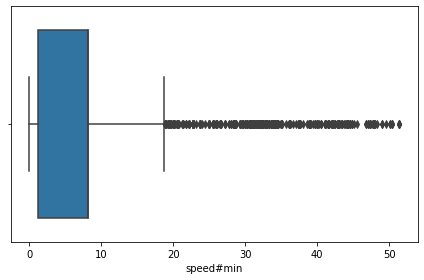

After Removing Outliers


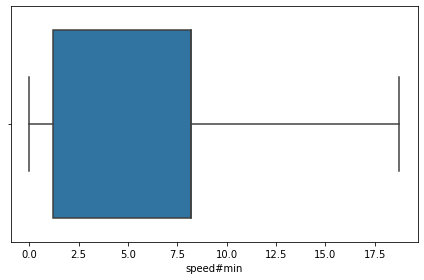

Before Removing Outliers


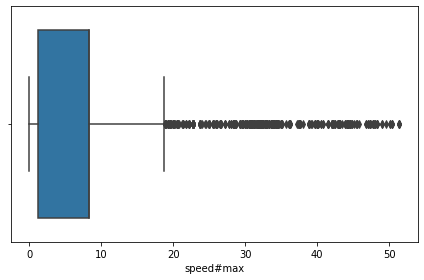

After Removing Outliers


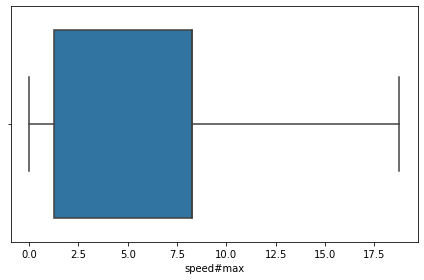

Before Removing Outliers


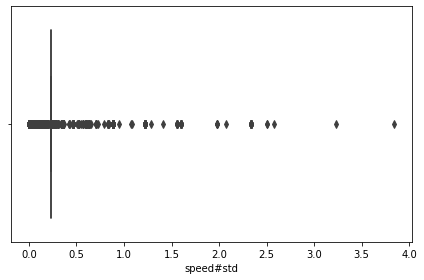

After Removing Outliers


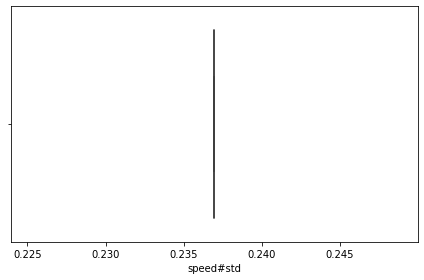

Before Removing Outliers


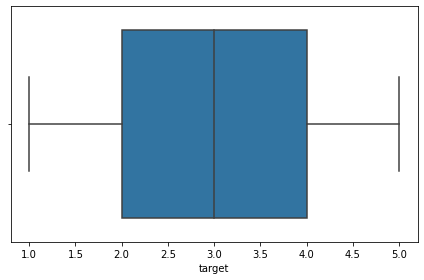

After Removing Outliers


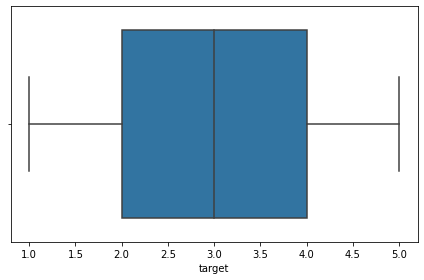

Before Removing Outliers


In [15]:
def remove_outliers(x):
## storing names of columns in Column_Names
    Column_Names=x.columns

    ## importing matplotlib and seaborn for visualisation of outliers
    import matplotlib.pyplot as plt
    import seaborn as sns   

    ## iterating through Column_Names using try and except for distinguishing between numerical and categorical columns
    for j in Column_Names:
        try:
            print('Before Removing Outliers')

            ##visualisation of outliers
            a = sns.boxplot(data=x,x=x[j])
            plt.tight_layout() 
            plt.show() 

            xy=x[j]    
            mydata=pd.DataFrame()

            updated=[]
            Q1,Q3=np.percentile(xy,[25,75])
            IQR=Q3-Q1
            minimum=Q1-1.5*IQR
            maximum=Q3+1.5*IQR

            ## using the maximum and minimum values obtained from quartiles and inter-quartile range
            ## any outliers greater than maximum are updated to be equal to maximum
            ## any outliers lesser than minimum are updated to be equal to minimum
            ## here, no outliers have been removed to prevent loss of data

            for i in xy:
                if(i>maximum):
                    i=maximum
                    updated.append(i)
                elif(i<minimum):
                    i=minimum
                    updated.append(i)
                else:
                    updated.append(i)

            x[j]=updated
            print('After Removing Outliers')

            ## visualising after removing outliers
            b= sns.boxplot(data=x,x=x[j])
            plt.tight_layout() 
            plt.show()

        except:
            continue

    return x
df3 = remove_outliers(df2)

In [16]:
df3

,Unnamed: 0,id,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
2946,2946,5228,190.0,92.0,10.179832,10.137434,10.207683,0.020380,0.995086,0.995067,...,84.350732,84.350732,84.350732,0.923820,8.235254,8.216747,8.253528,0.236959,3,U1
3075,3075,5835,193.0,75.0,10.179362,9.853068,10.587065,0.167584,0.987558,0.987359,...,89.762268,89.762268,89.762268,0.001198,8.235254,8.216747,8.253528,0.236959,3,U1
3076,3076,2274,256.0,75.0,9.657759,9.029124,10.286443,0.414025,0.844973,0.840452,...,89.769040,89.769040,89.769040,0.013131,18.768979,18.741867,18.758819,0.236959,1,U1
3077,3077,7287,86.0,100.0,10.299321,8.088142,12.456252,1.604990,0.968824,0.956427,...,88.572737,88.572737,88.572737,0.095157,0.750000,0.750000,0.750000,0.236959,5,U1
3079,3079,184,91.0,85.0,9.729062,7.139446,14.355289,2.184604,0.928255,0.925184,...,89.773691,89.767912,89.779470,0.008173,11.000000,11.000000,11.000000,0.236959,4,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1198,1198,12888,47.0,100.0,10.591780,6.701437,14.237094,2.528858,0.759280,0.743872,...,78.724855,78.451658,78.997213,1.913065,8.235254,8.216747,8.253528,0.236959,5,U9
3307,3307,12836,94.0,85.0,10.591780,7.289184,15.705589,2.528858,0.759280,0.743872,...,83.545534,83.545534,83.545534,1.800958,8.235254,8.216747,8.253528,0.236959,5,U9
4087,4087,12806,64.0,100.0,10.591780,6.759052,15.705589,2.528858,0.759280,0.743872,...,78.116997,78.116997,78.116997,1.800958,8.235254,8.216747,8.253528,0.236959,5,U9
3576,3576,12897,56.0,100.0,9.224362,4.975641,14.790456,2.528858,0.759280,0.743872,...,78.724855,78.451658,78.997213,1.913065,8.235254,8.216747,8.253528,0.236959,5,U9


In [17]:
#train=df2.sample(frac=0.8,random_state=1) #random state is a seed value #sample
#test=df2.drop(train.index)
df2 = df1

df2 = df2.drop(['user'], axis=1)
df2 = df2.drop(['id'],axis =1)

train_pct_index = int(0.8 * len(df2))
print(train_pct_index)
train, test = df2[:train_pct_index], df2[train_pct_index:]
print(train.shape, test.shape)

4714
(4714, 68) (1179, 68)


In [18]:
train_pct_index1 = int(0.2 * len(df2))
train_pct_index2 = int(0.4 * len(df2))
train_pct_index3 = int(0.6 * len(df2))
train_pct_index4 = int(0.8 * len(df2))
print(0,train_pct_index1,train_pct_index2,train_pct_index3,train_pct_index4,len(df2))
# first fold:
train1, test1 =  df2[train_pct_index1:], df2[:train_pct_index1]  # 20 to 100 
# 2 fold:
train2, test2 =  df2.head(train_pct_index2).append(df2.tail(train_pct_index2)), df2[train_pct_index1:train_pct_index2] # 40 to 100 + 0 to 20
train3, test3 =  df2.head(-train_pct_index3).append(df2.head(train_pct_index2)), df2[train_pct_index2:train_pct_index3] # 60 to 100 + 0 to 40
train4, test4 =  df2.head(-train_pct_index4).append(df2.head(train_pct_index3)), df2[train_pct_index3:train_pct_index4] # 80 to 100 + 0 to 60
train5, test5 =  df2[:train_pct_index4], df2[train_pct_index4:]  # 0 to 80

#print(train1.shape, test1.shape)
#print(train2.shape, test2.shape)
#print(train3.shape, test3.shape)
#print(train4.shape, test4.shape)
#print(train5.shape, test5.shape)

0 1178 2357 3535 4714 5893


In [19]:
train1

,Unnamed: 0,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,android.sensor.game_rotation_vector#max,...,android.sensor.step_counter#std,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target
5816,5816,333.5,100.0,9.803904,9.041084,10.600768,0.431985,0.873268,0.871488,0.875915,...,2.959475,78.724855,78.451658,78.997213,1.913065,18.768979,18.741867,18.758819,0.236959,1
5818,5818,22.0,75.0,10.241418,6.989096,12.978298,1.767100,0.972654,0.968368,0.976999,...,2.959475,89.832276,89.832276,89.832276,1.913065,6.750000,6.750000,6.750000,0.236959,4
5821,5821,51.0,75.0,10.076981,8.747623,11.593766,0.885338,0.929399,0.927497,0.932436,...,2.959475,89.782006,89.782006,89.782006,0.019147,10.250000,10.250000,10.250000,0.236959,4
5825,5825,99.0,85.0,9.674227,8.714782,10.585830,0.656325,0.737124,0.729523,0.741717,...,2.959475,89.782569,89.782569,89.782569,0.003391,18.768979,18.741867,18.758819,0.236959,1
4848,4848,25.0,75.0,10.171165,10.037080,10.269502,0.072740,0.993360,0.993266,0.993420,...,2.959475,89.753228,89.748990,89.759444,0.005501,8.235254,8.216747,8.253528,0.236959,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1198,1198,47.0,100.0,10.591780,6.701437,14.237094,2.528858,0.759280,0.743872,0.771629,...,2.959475,78.724855,78.451658,78.997213,1.913065,8.235254,8.216747,8.253528,0.236959,5
3307,3307,94.0,85.0,10.591780,7.289184,15.705589,2.528858,0.759280,0.743872,0.771629,...,2.959475,83.545534,83.545534,83.545534,1.800958,8.235254,8.216747,8.253528,0.236959,5
4087,4087,64.0,100.0,10.591780,6.759052,15.705589,2.528858,0.759280,0.743872,0.771629,...,2.959475,78.116997,78.116997,78.116997,1.800958,8.235254,8.216747,8.253528,0.236959,5
3576,3576,56.0,100.0,9.224362,4.975641,14.790456,2.528858,0.759280,0.743872,0.771629,...,2.959475,78.724855,78.451658,78.997213,1.913065,8.235254,8.216747,8.253528,0.236959,5


In [26]:
dilan_train = train1.copy()
dilan_train = dilan_train.drop(columns=['target'])
dilan_train.shape

(4715, 67)

In [27]:
dilan_train.to_csv('dilan_train.csv',index=False)

In [28]:
dilan_target_col = train1['target'].copy()
dilan_target_col.to_csv('dilan_target_col.csv', index=False)

In [21]:
y = train1.target
x = train1.loc[:, train.columns != 'target']
y1 = test1.target
x1 = test1.loc[:, test.columns != 'target']

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
model=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("internal accuracy:", metrics.accuracy_score(y_test, y_pred))

y_pred=model.predict(x1)
fold1= metrics.accuracy_score(y1, y_pred)

print("Accuracy:",fold1)

NameError: name 'metrics' is not defined

In [235]:
y = train2.target
x = train2.loc[:, train.columns != 'target']
y1 = test2.target
x1 = test2.loc[:, test.columns != 'target']


X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
model=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("internal accuracy:", metrics.accuracy_score(y_test, y_pred))

y_pred=model.predict(x1)
fold2= metrics.accuracy_score(y1, y_pred)
print("Accuracy:",fold2)

internal accuracy: 0.9840933191940615
Accuracy: 0.9957591178965225


In [236]:
y = train3.target
x = train3.loc[:, train.columns != 'target']
y1 = test3.target
x1 = test3.loc[:, test.columns != 'target']


X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
model=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("internal accuracy:", metrics.accuracy_score(y_test, y_pred))

y_pred=model.predict(x1)
fold3= metrics.accuracy_score(y1, y_pred)
print("Accuracy:",fold3)

internal accuracy: 0.9978791092258749
Accuracy: 0.4473684210526316


In [237]:
y = train4.target
x = train4.loc[:, train.columns != 'target']
y1 = test4.target
x1 = test4.loc[:, test.columns != 'target']


X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
model=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("internal accuracy:", metrics.accuracy_score(y_test, y_pred))

y_pred=model.predict(x1)
fold4= metrics.accuracy_score(y1, y_pred)
print("Accuracy:",fold4)

internal accuracy: 0.9862142099681867
Accuracy: 0.49957591178965227


In [233]:
y = train5.target
x = train5.loc[:, train.columns != 'target']
y1 = test5.target
x1 = test5.loc[:, test.columns != 'target']


X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
model=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("internal accuracy:", metrics.accuracy_score(y_test, y_pred))

y_pred=model.predict(x1)
fold5= metrics.accuracy_score(y1, y_pred)
print("Accuracy:",fold5)

internal accuracy: 0.9830328738069989
Accuracy: 0.5979643765903307


In [238]:
print("mean_fold:",(fold1+fold2+fold3+fold4+fold5)/5)

mean_fold: 0.7037193040057256


In [102]:
# stratified kfold insignificant --> 0.992

Accuracy: 0.992 (0.005)


Feature: 0, Score: 0.01886
Feature: 1, Score: 0.01023
Feature: 2, Score: 0.01171
Feature: 3, Score: 0.02018
Feature: 4, Score: 0.01523
Feature: 5, Score: 0.04524
Feature: 6, Score: 0.00991
Feature: 7, Score: 0.00977
Feature: 8, Score: 0.01002
Feature: 9, Score: 0.01575
Feature: 10, Score: 0.00849
Feature: 11, Score: 0.00781
Feature: 12, Score: 0.00831
Feature: 13, Score: 0.00479
Feature: 14, Score: 0.02756
Feature: 15, Score: 0.01571
Feature: 16, Score: 0.02094
Feature: 17, Score: 0.02345
Feature: 18, Score: 0.03115
Feature: 19, Score: 0.01167
Feature: 20, Score: 0.01723
Feature: 21, Score: 0.01273
Feature: 22, Score: 0.02040
Feature: 23, Score: 0.02303
Feature: 24, Score: 0.02634
Feature: 25, Score: 0.00563
Feature: 26, Score: 0.04768
Feature: 27, Score: 0.01836
Feature: 28, Score: 0.03366
Feature: 29, Score: 0.01490
Feature: 30, Score: 0.02519
Feature: 31, Score: 0.02150
Feature: 32, Score: 0.03165
Feature: 33, Score: 0.01164
Feature: 34, Score: 0.01678
Feature: 35, Score: 0.01821
Fe

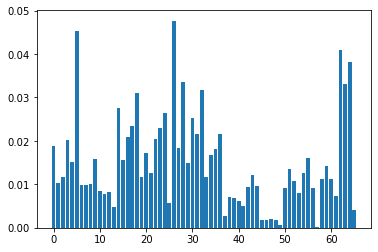

Accuracy: 0.9865724381625441


In [221]:
#pred = model.predict(x1)
from sklearn import metrics
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3)
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
# get importance
importance = clf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
plt.savefig('feature_distribution.png')
pyplot.show()

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


In [222]:
# evaluate a logistic regression model using k-fold cross-validation
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

model = RandomForestClassifier(n_estimators=100)
model1 = LogisticRegression()

# evaluate the model
cv = KFold(n_splits=10, random_state=1, shuffle=True)
n_scores = cross_val_score(model, x, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

Accuracy: 0.987 (0.003)


In [223]:
print(type(X_test),X_test.shape)
print(type(x1),x1.shape)
y_pred=clf.predict(x1)
print("Accuracy:",metrics.accuracy_score(y1, y_pred))

<class 'pandas.core.frame.DataFrame'> (1415, 66)
<class 'pandas.core.frame.DataFrame'> (1179, 66)
Accuracy: 0.6564885496183206


In [254]:
'''
a = x1[:1]
#print(type(a))
y_pred=clf.predict(a)
print(y_pred)
a.to_csv("input1.csv")
a = x1.iloc[[2]] # df.iloc[[0]]
y_pred=clf.predict(a)
print(y_pred)
a.to_csv("input2.csv")
a = x1.iloc[[4]]
y_pred=clf.predict(a)
print(y_pred)
a.to_csv("input3.csv")
a = x1.iloc[[5]]
y_pred=clf.predict(a)
print(y_pred)
a.to_csv("input4.csv")
a = x1.iloc[[7]]
y_pred=clf.predict(a)
print(y_pred)
a.to_csv("input5.csv")
'''


[3]
[1]
[4]
[2]
[5]


In [178]:
print("F1:", f1_score(y1, y_pred, average='macro'))

F1: 0.5572249730161619


In [92]:
train

,id,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,android.sensor.game_rotation_vector#max,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
2946,5228,190.0,92.0,10.179832,10.137434,10.207683,0.020380,0.995086,0.995067,0.995112,...,84.350732,84.350732,84.350732,0.923820,8.235254,8.216747,8.253528,0.236959,3,1
3075,5835,193.0,35.0,10.179362,9.853068,10.587065,0.167584,0.987558,0.987359,0.987745,...,89.762268,89.762268,89.762268,0.001198,8.235254,8.216747,8.253528,0.236959,3,1
3076,2274,256.0,8.0,9.657759,9.029124,10.286443,0.414025,0.844973,0.840452,0.851091,...,89.769040,89.769040,89.769040,0.013131,30.750000,30.750000,30.750000,0.236959,1,1
3077,7287,86.0,100.0,10.299321,8.088142,12.456252,1.604990,0.968824,0.956427,0.975352,...,88.572737,88.572737,88.572737,0.095157,0.750000,0.750000,0.750000,0.236959,5,1
3079,184,91.0,85.0,9.729062,7.139446,14.355289,2.184604,0.928255,0.925184,0.931989,...,89.773691,89.767912,89.779470,0.008173,11.000000,11.000000,11.000000,0.236959,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5223,21190,72.0,46.0,9.813829,8.480456,11.045430,0.420721,0.759280,0.743872,0.771629,...,70.725101,66.415385,75.034817,6.094859,3.500000,3.500000,3.500000,0.883883,4,6
1303,21588,28.0,100.0,9.594941,9.313803,9.864101,0.071488,0.759280,0.743872,0.771629,...,39.369659,39.369659,39.369659,1.913065,8.235254,8.216747,8.253528,0.236959,2,6
5527,21969,11.0,100.0,10.152073,5.343652,17.018795,2.925637,0.759280,0.743872,0.771629,...,72.157675,72.157675,72.157675,1.913065,0.750000,0.750000,0.750000,0.236959,5,6
2201,21349,54.0,100.0,10.062139,8.815584,11.753848,0.495030,0.759280,0.743872,0.771629,...,73.302235,73.302235,73.302235,1.999672,4.750000,4.750000,4.750000,0.236959,1,6


In [93]:
test

,id,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,android.sensor.game_rotation_vector#max,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
3405,22014,32.0,100.0,10.016017,6.695976,17.216023,2.291921,0.759280,0.743872,0.771629,...,77.430291,77.430291,77.430291,6.594260,2.358495,2.358495,2.358495,0.000000,5,6
5109,21477,12.0,100.0,10.076863,9.980503,10.172089,0.043253,0.759280,0.743872,0.771629,...,38.061800,38.061800,38.061800,1.038442,8.235254,8.216747,8.253528,0.236959,2,6
1061,21155,37.0,46.0,10.097191,8.677063,12.176887,0.579607,0.759280,0.743872,0.771629,...,74.703991,74.703991,74.703991,5.538316,3.250000,3.000000,3.500000,0.353553,4,6
1045,21440,67.0,46.0,9.667734,7.994919,12.931701,0.851957,0.759280,0.743872,0.771629,...,75.447901,75.447901,75.447901,3.376136,18.500000,18.500000,18.500000,0.353553,1,6
1317,21549,84.0,100.0,9.695505,9.557380,9.929158,0.060032,0.759280,0.743872,0.771629,...,36.123599,36.123599,36.123599,1.426948,8.235254,8.216747,8.253528,0.236959,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5063,20310,25.0,100.0,10.637163,2.471217,28.961093,5.469623,0.814607,0.814607,0.814607,...,84.941781,84.941781,84.941781,0.945771,1.463377,1.463377,1.463377,0.010040,5,13
1296,20330,45.0,100.0,11.333011,3.124888,35.098704,5.852742,0.763646,0.763646,0.763646,...,82.625956,82.625956,82.625956,5.321307,0.891086,0.883836,0.898335,0.010252,5,13
1619,20292,7.0,100.0,10.592901,4.633172,16.071722,2.962479,0.710383,0.647101,0.761554,...,84.591077,84.591077,84.591077,1.913065,1.402243,1.402243,1.402243,0.236959,5,13
2314,20299,14.0,100.0,11.132643,7.024562,18.064503,2.831729,0.923661,0.910555,0.943459,...,76.260939,76.260939,76.260939,1.913065,1.213918,1.213918,1.213918,0.236959,5,13


In [239]:
import pickle

filename = 'model.sav'
pickle.dump(model, open(filename, 'wb'))
 